# Visualisation

In [1]:
import polars as pl

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import altair as alt

In [2]:
csv_file = 'data/titanic.csv'

In [3]:
df = pl.read_csv(csv_file)
df.head(3)

PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
i64,i64,i64,str,str,f64,i64,i64,str,f64,str,str
1,0,3,"""Braund, Mr. Owen Harris""","""male""",22.0,1,0,"""A/5 21171""",7.25,null,"""S"""
2,1,1,"""Cumings, Mrs. John Bradley (Fl…","""female""",38.0,1,0,"""PC 17599""",71.2833,"""C85""","""C"""
3,1,3,"""Heikkinen, Miss. Laina""","""female""",26.0,0,0,"""STON/O2. 3101282""",7.925,null,"""S"""


## Bar chart

We begin by getting a count of the number of passengers in each passenger class. 

We use the `value_counts` method to count the occurences in the column.

In [4]:
passenger_class_counts_df = df["Pclass"].value_counts().sort("Pclass")
passenger_class_counts_df

Pclass,count
i64,u32
1,216
2,184
3,491


## Built-in plotting with Altair

A `DataFrame` has a built-in `.plot` method that passes the `DataFrame` to the Altair library. 

> Note that an `integer` column should be treated as a `categorical variable` or `ordinal variable` here.

In [21]:
passenger_class_counts_df.plot.bar(x="Pclass", y="count").properties(
    width=500
)  # Now the integer columns is treated a quantitative data now.

alt.Chart(...)

In [ ]:
passenger_class_counts_df.plot.bar(x="Pclass:O", y="count", color="Pclass").properties(
    width=200
)  # Now the integer column is a ordinal data.

alt.Chart(...)

Hover over each bar you will see a `tooltip` which displays the name and height of the bar by default.

There is a less verbose way to manage the dtypes as we can use the [Altair system for encoding data types](https://altair-viz.github.io/user_guide/encodings/index.html#encoding-data-types) to override the default mapping from Polars dtype to Altair encoding.  

These Altair encodings are:
- `Q` for quantitative data
- `O` for ordinal data
- `N` for categorical data
- `T` for datetime data

Try changing the `:O` to the other encodings listed above to see the effect on the chart.

The output of `plot.bar` is a normal Altair `Chart` object so we can use standard Altair methods to configure the chart.

In [24]:
passenger_class_counts_df.plot.bar(
    x="Pclass:O", y="count", tooltip=["Pclass", "count"]
).properties(width=500, title="Number of passengers by class")

alt.Chart(...)

The arguments to the plot method are Altair `Channel` objects rather than column name strings. 

This means we can use Altair axis objects to apply more control over styling. 

Here for example:
- use `alt.X` and `alt.Y` to add axis titles
- use `alt.Tooltip` to override the default tooltip

In [25]:
passenger_class_counts_df.plot.bar(
    x=alt.X("Pclass:O", title="Passenger class"),
    y=alt.Y("count", title="Number of passengers"),
    tooltip=[
        alt.Tooltip("Pclass", title="Class"),
        alt.Tooltip("count", title="Nr of passengers"),
    ],
).properties(width=500)

alt.Chart(...)

In Altair we can also apply functions to transform or aggregate the data.

[Aggregation functions](https://altair-viz.github.io/user_guide/encodings/index.html#aggregation-functions).

In [26]:
df.plot.bar(
    x=alt.X("Pclass:O", title="Passenger class"),
    y=alt.Y(
        "count()", title="Number of Passengers"
    ),  # Here is count() instead of count
).properties(width=500)

alt.Chart(...)

We can make a stacked bar chart with colors on each bar set by another column by adding the `color` argument.

In [32]:
df.plot.bar(
    x=alt.X("Pclass:O", title="Passenger class"),
    y=alt.Y("count()", title="Number of Passengers"),
    color=alt.Color("Survived:N"),
    tooltip=[
        alt.Tooltip("Pclass", title="Class"),
        "Survived",
        alt.Tooltip("count()", title="count"),
    ],
).properties(width=500)

alt.Chart(...)

If we pass the full dataset to Altair and it has more than 5000 rows we get the dreaded Altair MaxRowsLimit error. 

There [are ways around this](https://altair-viz.github.io/user_guide/large_datasets.html) such as turning off the limit or using [vegafusion](https://www.rhosignal.com/posts/polars-and-altair/).

In [ ]:
pl.concat([df] * 10).plot.bar(
    x=alt.X("Pclass:O", title="Passenger class"),
    y=alt.Y("count()", title="Number of Passengers"),
    color=alt.Color("Survived:N"),
    tooltip=[
        alt.Tooltip("Pclass", title="Class"),
        "Survived",
        alt.Tooltip("count()", title="count"),
    ],
).properties(width=500)

MaxRowsError: The number of rows in your dataset (8910) is greater than the maximum allowed (5000).

Try enabling the VegaFusion data transformer which raises this limit by pre-evaluating data
transformations in Python.
    >> import altair as alt
    >> alt.data_transformers.enable("vegafusion")

Or, see https://altair-viz.github.io/user_guide/large_datasets.html for additional information
on how to plot large datasets.

alt.Chart(...)

### Scatter plot

In [38]:
df.plot.scatter(
    x="Age",
    y="Fare",
).properties(width=500)

alt.Chart(...)

In this case `Pclass` is the color, kind of a `grouping basis`.

In [40]:
df.plot.scatter(
    x="Age", y="Fare", color="Pclass:N", tooltip=["Age", "Fare", "Pclass", "Name"]
).properties(width=500, title="Age vs Fare")

alt.Chart(...)

Control the colormap with the `configure_range` method and the [Vega color schemas](https://vega.github.io/vega/docs/schemes/).

In [50]:
df.with_columns(pl.col("Pclass").cast(pl.String)).plot.scatter(
    x="Age", y="Fare", color="Pclass", tooltip=["Age", "Fare", "Pclass", "Name"]
).properties(width=500).configure_range(category={"scheme": "paired"})

alt.Chart(...)

### Histogram
We can make a histogram either from a `hist` expression on a `Series`

In [60]:
df["Age"].hist(bin_count=10).head(2).to_dicts()

[{'breakpoint': 8.378, 'category': '[0.42, 8.378]', 'count': 54},
 {'breakpoint': 16.336000000000002,
  'category': '(8.378, 16.336]',
  'count': 46}]

We then use either the `breakpoint` or `category` columns as the axis

In [58]:
df["Age"].hist(bin_count=10).plot.bar(x="breakpoint", y="count").properties(width=500)

alt.Chart(...)

In [57]:
df["Age"].hist(bin_count=10).plot.bar(x="category", y="count").properties(width=500)

alt.Chart(...)

## Plotting directly with external libraries
We can also pass a Polars `DataFrame` directly to external libraries.

### Matplotlib

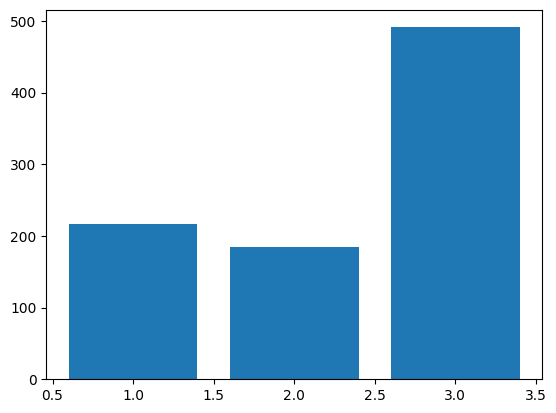

In [64]:
plt.bar(
    x=passenger_class_counts_df["Pclass"], height=passenger_class_counts_df["count"]
)

plt.show()

`Pclass` column is an integer column in Polars but the x-axis in the chart is a float axis. 

To make this appear as an categorical integer axis we cast the integers to strings.

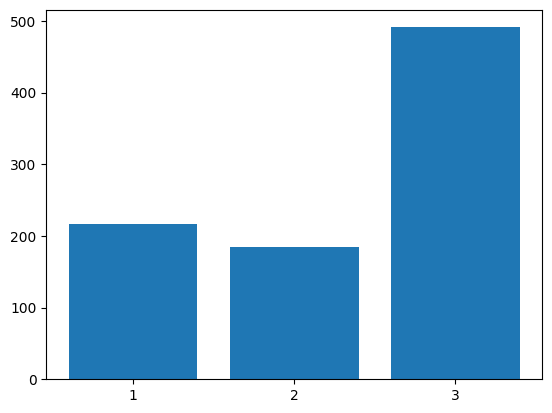

In [66]:
passenger_class_counts_string_column_df = passenger_class_counts_df.with_columns(
    pl.col("Pclass").cast(pl.String)
)

plt.bar(
    x=passenger_class_counts_string_column_df["Pclass"],
    height=passenger_class_counts_string_column_df["count"],
)

plt.show()

Matplotlib does not have explicit support for Polars. 

However, it accepts a Polars `Series` as it just needs sequence-type objects that it can iterate through using standard python methods (that a `Series` supports).

### Seaborn
We can pass a Polars `DataFrame` to Seaborn for many charts. Note that Seaborn then typically copies the data to Pandas internally as it makes extensive use of Pandas-specific features such as the index. With a large `DataFrame` you may want to only pass the columns needed for the plot to avoid the whole `DataFrame` being copied!

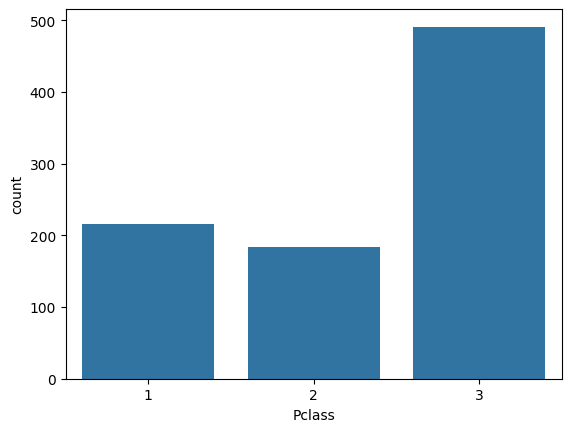

In [68]:
sns.barplot(passenger_class_counts_df, x="Pclass", y="count")

plt.show()

Some more complicated Seaborn charts also accept a Polars `DataFrame` directly such as `sns.scatterplot` or `sns.jointplot`.

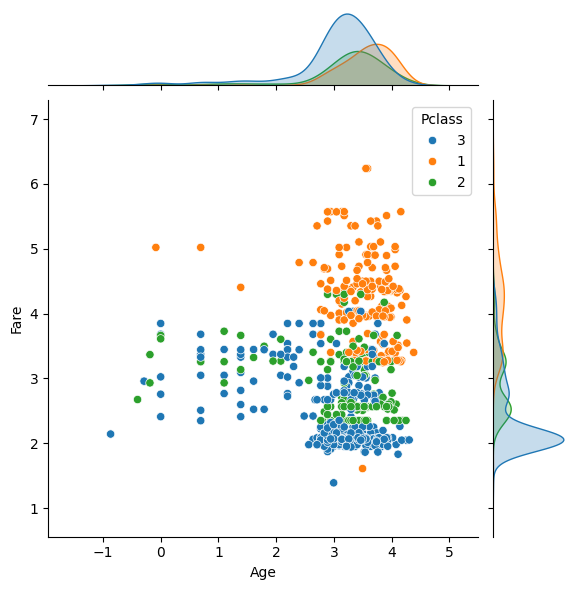

In [71]:
sns.jointplot(
    data=(df.with_columns([pl.col(pl.Float64).log(), pl.col("Pclass").cast(pl.String)])),
    x="Age",
    y="Fare",
    hue="Pclass",
)

plt.show()

### Plotly
We can pass a `DataFrame` directly to Plotly - note that we again use the `DataFrame` with a string column for correct output.

In [72]:
px.bar(
    passenger_class_counts_string_column_df,
    x="Pclass",
    y="count",
    color="Pclass",
    width=400,
)

### Altair
We can pass a `DataFrame` directly to Altair

In [73]:
alt.Chart(passenger_class_counts_df, width=600).mark_bar().encode(
    x="Pclass:N",
    y="count:Q",
    color="Pclass:N",
)

alt.Chart(...)

## Exercises

In [97]:
pl.read_parquet("data/bike_sales.parquet").glimpse()

Rows: 25982
Columns: 10
$ date            <date> 2013-01-28, 2015-01-28, 2013-07-22, 2015-07-22, 2013-12-25, 2015-12-25, 2014-02-13, 2016-02-13, 2013-07-04, 2015-07-04
$ customer age     <i64> 31, 31, 31, 31, 31, 31, 31, 31, 32, 32
$ customer gender  <str> 'M', 'M', 'M', 'M', 'M', 'M', 'M', 'M', 'M', 'M'
$ country          <str> 'Australia', 'Australia', 'Australia', 'Australia', 'Australia', 'Australia', 'Australia', 'Australia', 'Australia', 'Australia'
$ sub category     <str> 'Mountain Bikes', 'Mountain Bikes', 'Mountain Bikes', 'Mountain Bikes', 'Mountain Bikes', 'Mountain Bikes', 'Mountain Bikes', 'Mountain Bikes', 'Mountain Bikes', 'Mountain Bikes'
$ order quantity   <i64> 1, 1, 1, 2, 1, 3, 1, 2, 1, 1
$ unit cost        <i64> 1912, 1912, 1912, 1912, 1912, 1912, 1912, 1912, 1912, 1912
$ unit price       <i64> 3400, 3400, 3400, 3400, 3400, 3400, 3400, 3400, 3400, 3400
$ cost             <i64> 1912, 1912, 1912, 3824, 1912, 5736, 1912, 3824, 1912, 1912
$ revenue          <i64> 2856,

Create a `DataFrame` of bike sales and replace spaces in the string column names with `_`.

In [76]:
df_bike = pl.read_parquet("data/bike_sales.parquet").pipe(
    lambda df: df.rename({col: col.replace(" ", "_") for col in df.columns})
)
df_bike.head(2)

date,customer_age,customer_gender,country,sub_category,order_quantity,unit_cost,unit_price,cost,revenue
date,i64,str,str,str,i64,i64,i64,i64,i64
2013-01-28,31,"""M""","""Australia""","""Mountain Bikes""",1,1912,3400,1912,2856
2015-01-28,31,"""M""","""Australia""","""Mountain Bikes""",1,1912,3400,1912,2856


We do a `group_by` first to get the data

In [77]:
customer_count_df = (
    df_bike.group_by("customer_age", maintain_order=True).len().sort("customer_age")
)
customer_count_df

customer_age,len
i64,u32
17,280
18,366
19,438
20,322
21,296
…,…
67,4
68,4
69,6


Using the built-in plot method make a bar chart of the `customer_age` column showing the number of bikes sold by customer_age.

In [102]:
customer_count_df.plot.bar(
    x=alt.X("customer_age:O", title="Customer age"),
    y=alt.Y("len", title="Number of bikes sold"),
).properties(width=800)

alt.Chart(...)

For the next exercise we disable the max rows limit in Altair so we can do calculations on the 25000 rows in `df_bike`

In [87]:
import altair as alt
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

Make the same plot directly from `df_bike` but this time using Altair to do the counting

In [104]:
df_bike.plot.bar(
    x=alt.X("customer_age:O", title="Customer age"),
    y=alt.Y("count()", title="Number of bikes sold"),
).properties(width=800)

alt.Chart(...)

Instead of a count of rows do a sum of the revenue column. 

Do this as a stacked bar chart coloured by `sub_category` of bike.

In [105]:
df_bike.plot.bar(
    x=alt.X("customer_age:O", title="Customer age"),
    y=alt.Y("sum(revenue)", title="Number of revenue"),
    color="sub_category",
).properties(width=800)

alt.Chart(...)